Немного EDA для маркетинговых данных:

Вам предложены данные iFood — приложения для доставки еды в Бразилии, представленного более чем в тысяче городов. Поддержание высокой вовлеченности клиентов является важной задачей для компании. Для того, чтобы создавать новые предложения и проводить качественные рекламные кампании, необходимо понимать особенности и потребности целевой аудитории. Для этого были собраны данные о клиентах, использующих приложение. Вам предстоит выявить особенности людей, пользующихся данным приложением и найти интересные закономерности.

Почитать про компанию можно на википедии: https://en.wikipedia.org/wiki/IFood

Описание данных:

AcceptedCmp1 - 1 if customer accepted the offer in the 1st campaign, 0 otherwise

AcceptedCmp2 - 1 if customer accepted the offer in the 2nd campaign, 0 otherwise

AcceptedCmp3 - 1 if customer accepted the offer in the 3rd campaign, 0 otherwise

AcceptedCmp4 - 1 if customer accepted the offer in the 4th campaign, 0 otherwise

AcceptedCmp5 - 1 if customer accepted the offer in the 5th campaign, 0 otherwise

Response (target) - 1 if customer accepted the offer in the last campaign, 0 otherwise

Complain - 1 if customer complained in the last 2 years

DtCustomer - date of customer’s enrolment with the company

Education - customer’s level of education

Marital - customer’s marital status

Kidhome - number of small children in customer’s household

Teenhome - number of teenagers in customer’s household

Income - customer’s yearly household income

MntFishProducts - amount spent on fish products in the last 2 years

MntMeatProducts - amount spent on meat products in the last 2 years

MntFruits - amount spent on fruits products in the last 2 years

MntSweetProducts - amount spent on sweet products in the last 2 years

MntWines - amount spent on wine products in the last 2 years

MntGoldProds - amount spent on gold products in the last 2 years

NumDealsPurchases - number of purchases made with discount

NumCatalogPurchases - number of purchases made using catalogue

NumStorePurchases - number of purchases made directly in stores

NumWebPurchases - number of purchases made through company’s web site

NumWebVisitsMonth - number of visits to company’s web site in the last month

Recency - number of days since the last purchase

1 этап: предобработка данных

In [ ]:
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

In [ ]:
import pandas as pd
df = pd.read_csv("https://raw.githubusercontent.com/V-Marco/public_intro_to_DS_mba_hse/main/HW/marketing.csv")

Изучите данные. Какие типы данных здесь представлены? Все ли данные считались в корректном и удобном для работы формате? Если нет, то с какими данными есть проблемы?

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   ID                   2240 non-null   int64 
 1   Year_Birth           2240 non-null   int64 
 2   Education            2240 non-null   object
 3   Marital_Status       2240 non-null   object
 4   Income               2216 non-null   object
 5   Kidhome              2240 non-null   int64 
 6   Teenhome             2240 non-null   int64 
 7   Dt_Customer          2240 non-null   object
 8   Recency              2240 non-null   int64 
 9   MntWines             2240 non-null   int64 
 10  MntFruits            2240 non-null   int64 
 11  MntMeatProducts      2240 non-null   int64 
 12  MntFishProducts      2240 non-null   int64 
 13  MntSweetProducts     2240 non-null   int64 
 14  MntGoldProds         2240 non-null   int64 
 15  NumDealsPurchases    2240 non-null   int64 
 16  NumWeb

####В данном датасете представлены 2 типа данных: int64 и object

In [ ]:
# распределение значений
df.dtypes.value_counts()

int64     23
object     5
dtype: int64

In [ ]:
df.shape

(2240, 28)

In [ ]:
# проверяем статистику, транспонируем чтоб легче читалось
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,2240.0,5592.159821,3246.662198,0.0,2828.25,5458.5,8427.75,11191.0
Year_Birth,2240.0,1968.805804,11.984069,1893.0,1959.00,1970.0,1977.00,1996.0
Kidhome,2240.0,0.444196,0.538398,0.0,0.00,0.0,1.00,2.0
Teenhome,2240.0,0.506250,0.544538,0.0,0.00,0.0,1.00,2.0
Recency,2240.0,49.109375,28.962453,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.935714,336.597393,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.302232,39.773434,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.950000,225.715373,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.525446,54.628979,0.0,3.00,12.0,50.00,259.0
MntSweetProducts,2240.0,27.062946,41.280498,0.0,1.00,8.0,33.00,263.0


...

In [ ]:
# разновидность образования
df['Education'].unique()

array(['Graduation', 'PhD', '2n Cycle', 'Master', 'Basic'], dtype=object)

In [ ]:
# вероятно разброс стран, откуда была совершена покупка
df['Country'].unique() 

array(['SP', 'CA', 'US', 'AUS', 'GER', 'IND', 'SA', 'ME'], dtype=object)

Теперь необходимо привести некоторые данные в корректный вид. Преобразуйте признак income так, чтобы значения этого признака были обычными вещественными числами (float)

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/V-Marco/public_intro_to_DS_mba_hse/main/HW/marketing.csv', decimal = ",")
df['Income'].head(5)

0    $84,835.00 
1    $57,091.00 
2    $67,267.00 
3    $32,474.00 
4    $21,474.00 
Name: Income, dtype: object

source: https://pythonshowcase.com/question/getting-attributeerror-float-object-has-no-attribute-replace-error

In [ ]:
# используем лямбда функцию 
df['Income'] = df['Income'].apply(lambda x: str(x).replace('$', '').replace(',', '')).astype('float')
df['Income']

0       84835.0
1       57091.0
2       67267.0
3       32474.0
4       21474.0
         ...   
2235    66476.0
2236    31056.0
2237    46310.0
2238    65819.0
2239    94871.0
Name: Income, Length: 2240, dtype: float64

In [ ]:
df['Income'].describe()

count      2216.000000
mean      52247.251354
std       25173.076661
min        1730.000000
25%       35303.000000
50%       51381.500000
75%       68522.000000
max      666666.000000
Name: Income, dtype: float64

Кроме того, даты нам было бы удобнее представить в корректном формате ГГГГ-ММ-ДД. Преобразуем данные с датами в соответствующий вид.

In [ ]:
# изначально данные были щаписаны в таком формате,который нам не оч подходит
df.Dt_Customer

0        6/16/14
1        6/15/14
2        5/13/14
3        5/11/14
4         4/8/14
          ...   
2235      3/7/13
2236     1/22/13
2237     12/3/12
2238    11/29/12
2239      9/1/12
Name: Dt_Customer, Length: 2240, dtype: object

source: https://newtechaudit.ru/gruzi-daty-krasivo/

In [ ]:
# преобразуем столбец с датами Dt_Customer в нужный нам тип 'datetime64[ns]' и прогоним для первых пяти строчек чтоб наглядно показать изменения
df = pd.read_csv('https://raw.githubusercontent.com/V-Marco/public_intro_to_DS_mba_hse/main/HW/marketing.csv', parse_dates=['Dt_Customer'])
df['Dt_Customer']

0      2014-06-16
1      2014-06-15
2      2014-05-13
3      2014-05-11
4      2014-04-08
          ...    
2235   2013-03-07
2236   2013-01-22
2237   2012-12-03
2238   2012-11-29
2239   2012-09-01
Name: Dt_Customer, Length: 2240, dtype: datetime64[ns]

2 этап: пропуски и выбросы

Исследовать данные на предмет пропусков и выбросов. Есть ли в данных пропуски?

Сколько и в каких признаках? Как вы будете их обрабатывать? Обработайте пропуски, пояснив выбранную вами стратегию обработки.

важно: просто удалить - это не стратегия обработки

In [ ]:
# кол-во пропущенных значений в каждом столбце
display(df.isna().sum())
display(df.isna().sum().sum() / (len(df) * len(df.columns)))
# общий % пропущенных данных в датасете

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Response                0
Complain                0
Country                 0
dtype: int64

0.0003826530612244898

####Заметим, что в основном данные не пропущены кроме столбца Income, поэтому воспользуемся **стандартными статистическими методами** замены пропущенных данных: *mode*, *mean*, *median*

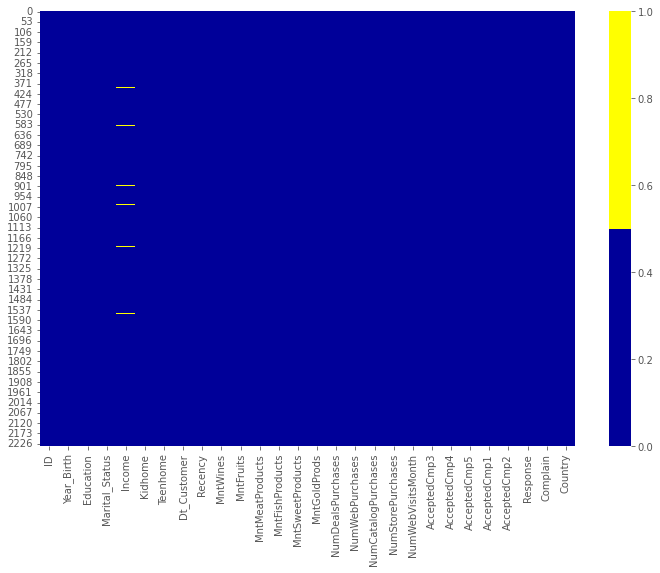

In [ ]:
cols = df.columns[:30] # первые 30 колонок
# данные: желтый - пропущенные, синий - не пропущенные
colours = ['#000099', '#ffff00'] 
sns.heatmap(df[cols].isnull(), cmap=sns.color_palette(colours))

In [ ]:
# процентный список пропущенных значений
import numpy as np
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

ID - 0%
Year_Birth - 0%
Education - 0%
Marital_Status - 0%
Income - 1%
Kidhome - 0%
Teenhome - 0%
Dt_Customer - 0%
Recency - 0%
MntWines - 0%
MntFruits - 0%
MntMeatProducts - 0%
MntFishProducts - 0%
MntSweetProducts - 0%
MntGoldProds - 0%
NumDealsPurchases - 0%
NumWebPurchases - 0%
NumCatalogPurchases - 0%
NumStorePurchases - 0%
NumWebVisitsMonth - 0%
AcceptedCmp3 - 0%
AcceptedCmp4 - 0%
AcceptedCmp5 - 0%
AcceptedCmp1 - 0%
AcceptedCmp2 - 0%
Response - 0%
Complain - 0%
Country - 0%


если бы % пропущенных данных для какой-то категории превышал бы 40%, то имело бы место исключить данную категорию из датасета

created missing indicator for: Income


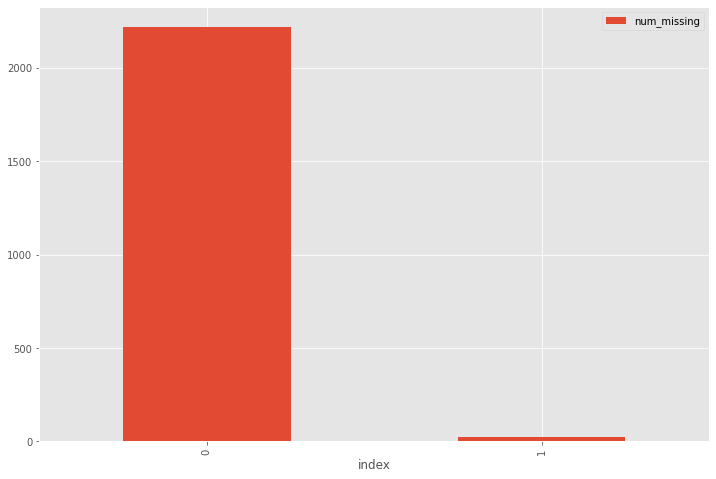

In [ ]:
for col in df.columns:
    missing = df[col].isnull()
    num_missing = np.sum(missing)
    
    if num_missing > 0:  
        print('created missing indicator for: {}'.format(col))
        df['{}_ismissing'.format(col)] = missing


# затем на основе индикатора строим гистограмму
ismissing_cols = [col for col in df.columns if 'ismissing' in col]
df['num_missing'] = df[ismissing_cols].sum(axis=1)

df['num_missing'].value_counts().reset_index().sort_values(by='index').plot.bar(x='index', y='num_missing')

In [ ]:
# impute the missing values and create the missing value indicator variables for each numeric column.
df_numeric = df.select_dtypes(include=[np.number])
numeric_cols = df_numeric.columns.values

for col in numeric_cols:
    missing = df[col].isnull()
    num_missing = np.sum(missing)
    
    if num_missing > 0:  # only do the imputation for the columns that have missing values.
        print('imputing missing values for: {}'.format(col))
        df['{}_ismissing'.format(col)] = missing
        med = df['Income'].median()
        df['Income'] = df['Income'].fillna(med)

imputing missing values for: Income


Исследуем данные на предмет выбросов и удалим их, если они есть. Если выбросы есть - продемонстрируем это численно и с помощью визуализаций. 

Прокомментируем, как мы ищем выбросы, и почему их стоит удалить.

Для численного признака такого как Income, стоит воспользоваться классической гистограммой и коробчатой диаграмой, чтобы изучить распределение и обнаружить выбросы в данных.

source: https://proglib.io/p/moem-dataset-rukovodstvo-po-ochistke-dannyh-v-python-2020-03-27

In [ ]:
df['Income'].describe()

count      2240.000000
mean      52237.975446
std       25037.955891
min        1730.000000
25%       35538.750000
50%       51381.500000
75%       68289.750000
max      666666.000000
Name: Income, dtype: float64

Сравнивая со значениями из прошлой ячейки со статистикой для признака Income, можно заметить что 24 пропущеных значения были заменены средним значением по всему признаку Income. Интересно заметить, что максимальное значение равно 666666 😈, в то время как 75% квартиль равен только 68289.75. Следовательно, значение 666666 – выброс, красивое число конечно 😎☝🏽

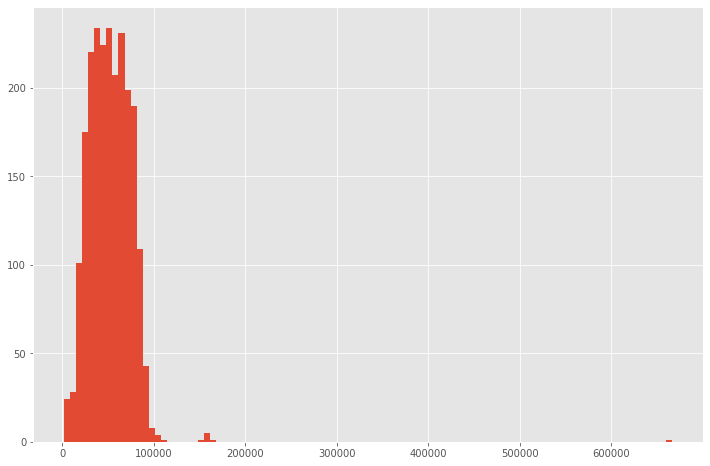

In [ ]:
df['Income'].hist(bins=100)

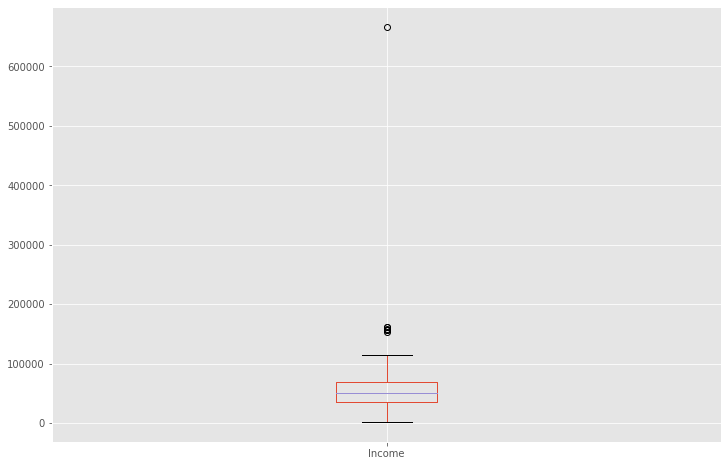

In [ ]:
# построим коробчатую диаграмму
df.boxplot(column=['Income'])

Визуально видно, что есть выброс со значением > 600k

список признаков, у которых более 95% строк содержат одно и то же значение

In [ ]:
num_rows = len(df.index)
low_information_cols = [] 

for col in df.columns:
    cnts = df[col].value_counts(dropna=False)
    top_pct = (cnts/num_rows).iloc[0]
    
    if top_pct > 0.95:
        low_information_cols.append(col)
        print('{0}: {1:.5f}%'.format(col, top_pct*100))
        print(cnts)
        print()

AcceptedCmp2: 98.66071%
0    2210
1      30
Name: AcceptedCmp2, dtype: int64

Complain: 99.06250%
0    2219
1      21
Name: Complain, dtype: int64

Income_ismissing: 98.92857%
False    2216
True       24
Name: Income_ismissing, dtype: int64

num_missing: 98.92857%
0    2216
1      24
Name: num_missing, dtype: int64



3 этап: новые признаки

Подумаем, какие осмысленные признаки можно создать из имеющихся? Придумаем как минимум 2 и добавим их, содержательно описав, почему мы их добавляем и по какому принципу.

In [ ]:
# Select the numeric columns
numeric_subset = df.select_dtypes('number')
numeric_subset

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,num_missing
0,1826,1970,84835.0,0,0,0,189,104,379,111,...,6,1,0,0,0,0,0,1,0,0
1,1,1961,57091.0,0,0,0,464,5,64,7,...,7,5,0,0,0,0,1,1,0,0
2,10476,1958,67267.0,0,1,0,134,11,59,15,...,5,2,0,0,0,0,0,0,0,0
3,1386,1967,32474.0,1,1,0,10,0,1,0,...,2,7,0,0,0,0,0,0,0,0
4,5371,1989,21474.0,1,0,0,6,16,24,11,...,2,7,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10142,1976,66476.0,0,1,99,372,18,126,47,...,11,4,0,0,0,0,0,0,0,0
2236,5263,1977,31056.0,1,0,99,5,10,13,3,...,3,8,0,0,0,0,0,0,0,0
2237,22,1976,46310.0,1,0,99,185,2,88,15,...,5,8,0,0,0,0,0,0,0,0
2238,528,1978,65819.0,0,0,99,267,38,701,149,...,10,3,0,0,0,0,0,0,0,0


Видим, что в датасете много столбцов с acceptance, поэтому будет разумно их разбить для одного клиента, в таком случае, если клиент принимает все - присвоим значение 5 из шкалы, в случае если ни одной не принимает - присвоим значение 0. 

In [ ]:
df['AcceptedCmp'] = np.where(df['AcceptedCmp1'] + df['AcceptedCmp2'] + df['AcceptedCmp3'] + df['AcceptedCmp4'] + df['AcceptedCmp4'] > 4.5, 1, 0)
df['AcceptedCmp']

0       0
1       0
2       0
3       0
4       0
       ..
2235    0
2236    0
2237    0
2238    0
2239    0
Name: AcceptedCmp, Length: 2240, dtype: int64

In [ ]:
# Create columns with log of numeric columns
for col in numeric_subset.columns:
    # Skip the Income column
    if col == 'Income':
        next
    else:
        numeric_subset['log_' + col] = np.log(numeric_subset[col])

/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


теперь мы имеем больше фичей, а также отдельные признаки для каждой из стран

In [ ]:
# Select the categorical columns
categorical_subset = df[['Country']]

# One hot encode
categorical_subset = pd.get_dummies(categorical_subset)

# Join the two dataframes using concat
# Make sure to use axis = 1 to perform a column bind
features = pd.concat([numeric_subset, categorical_subset], axis = 1)
features

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,log_Complain,log_num_missing,Country_AUS,Country_CA,Country_GER,Country_IND,Country_ME,Country_SA,Country_SP,Country_US
0,1826,1970,84835.0,0,0,0,189,104,379,111,...,-inf,-inf,0,0,0,0,0,0,1,0
1,1,1961,57091.0,0,0,0,464,5,64,7,...,-inf,-inf,0,1,0,0,0,0,0,0
2,10476,1958,67267.0,0,1,0,134,11,59,15,...,-inf,-inf,0,0,0,0,0,0,0,1
3,1386,1967,32474.0,1,1,0,10,0,1,0,...,-inf,-inf,1,0,0,0,0,0,0,0
4,5371,1989,21474.0,1,0,0,6,16,24,11,...,-inf,-inf,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10142,1976,66476.0,0,1,99,372,18,126,47,...,-inf,-inf,0,0,0,0,0,0,0,1
2236,5263,1977,31056.0,1,0,99,5,10,13,3,...,-inf,-inf,0,0,0,0,0,0,1,0
2237,22,1976,46310.0,1,0,99,185,2,88,15,...,-inf,-inf,0,0,0,0,0,0,1,0
2238,528,1978,65819.0,0,0,99,267,38,701,149,...,-inf,-inf,0,0,0,1,0,0,0,0


4 этап: время статистики!

Рассчитаем все описательные статистики для категориальных переменных. Опишем, какие выводы мы можем сделать из полученных данных.

source 1: https://proglib.io/p/analiziruy-dannye-s-pomoshchyu-odnoy-stroki-koda-na-python-2019-10-02

source 2: https://stackoverflow.com/questions/57193292/pandas-profiling-error-attributeerror-dataframe-object-has-no-attribute-prof

Воспользуемся необычной техникой - **профилированием**.

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Заменив пропущенные данные медианой в признаке Income, мы полуяаем следующий репорт:

In [ ]:
import pandas_profiling
#pd.read_csv('https://raw.githubusercontent.com/V-Marco/public_intro_to_DS_mba_hse/main/HW/marketing.csv').profile_report()
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Как ни странно большая часть клиентов приходится из Сан Пауло ~ 1k людей, половина клиентов образованы, ~22% имеют докторскую степень, что непременно похвально, ~17% имеют степень магистра, что показывает на образованную ЦА у данного производителя, женатых парочек вдвое больше чем одиночек, средний возраст клиентов относится к 1968 году рождения, что говорит о достаточно пожилой ЦА,  но как видно трудоспособной и знакомой с новыми технологиями, средний доход составляет ~51k, в большинстве случаев клиенты заказывают по 2 товара в заказе, но это число варьируется от 1 до 4, вживую же клиенты более щедрые и берут по 3-4 товара в одни руки, использование каталога для покупки товаров отнюдь не является эффективным способом, клиент скорее не возьмёт товар, недели чем приобретёт, единичные покупки по скидке пользуются популярностью (43%), золото и вино не пользуются спросом в отличие от сладостей, рыбы, фруктов

Рассчитаем все описательные статистики для количественных переменных. Опишем, какие выводы мы можем сделать из полученных данных (хотя бы про 3 признака).

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,2240.0,5592.159821,3246.662198,0.0,2828.25,5458.5,8427.75,11191.0
Year_Birth,2240.0,1968.805804,11.984069,1893.0,1959.00,1970.0,1977.00,1996.0
Income,2240.0,52237.975446,25037.955891,1730.0,35538.75,51381.5,68289.75,666666.0
Kidhome,2240.0,0.444196,0.538398,0.0,0.00,0.0,1.00,2.0
Teenhome,2240.0,0.506250,0.544538,0.0,0.00,0.0,1.00,2.0
Recency,2240.0,49.109375,28.962453,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.935714,336.597393,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.302232,39.773434,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.950000,225.715373,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.525446,54.628979,0.0,3.00,12.0,50.00,259.0


- всего 2240 респондентов
- доход варируется между 1730 и 666k со средним значением в 52k
- кол-во детей в семьей варируется от 0 до 2, ссылаясь на среднее значение - можно сказать что в семье скореее нет ребенка, чем он есть
- в среднем проходит 50 дней с момента посденей покупки
- в среднем больше всего денег было потрачено на вино, а затем на мясо, что указывает на то, что ЦА любит выпить хорошее вино и насладиться сочным стейком
- хоть и покупки с использованием каталога в среднем не является привлекательным способом, 28 - насчитывается как максимальное кол-во покупок данным способом за раз
- большинство покупок совершается напрямую в магазине

Выберем 3 интересующих нас количественных признака и рассчитаем релевантные с нашей точки зрения описательные статистики для этих признаков, сгруппировав данные по семейному положению, образованию, стране. Какие закономерности мы можем отметить? Как их можно проинтерпретировать?

In [ ]:
#Pivot table
delivery_pivot2=pd.pivot_table(df,index=["Education","Marital_Status"],
                               values=['Income', 'Kidhome'],
                               aggfunc=[np.mean,len,np.std])

#Adding bar for numbers
delivery_pivot2.style.bar()

- в среднем люди, имеющие образование бакалавра, мастера и доктора наук, находясь без партнера/партнерши, имеют ребенка
- в среднем личности с обычным школьным образованием, находясь в разводе, имеют ребенка, также одинокие личности относятся к этой категории
- в среднем имея степень бакалавра и являясь абсурдным, можно иметь неплохой доход, превышающий все остальные взаимосвязи

In [ ]:
#Pivot table
delivery_pivot2=pd.pivot_table(df,index=["Education","Marital_Status", "Country"],
                               values=['Income', 'Kidhome'],
                               aggfunc=[np.mean,len,np.std])

#Adding bar for numbers
delivery_pivot2.style.bar()

- разброс доходов граждан SA живущих вместе и имеющих степень бакалавра составляет ~97k, что показывает на нестабильный доход и разновидность профессий 
- в среднем клиенты из Австралии, которые находятся в разводе и имеют степень 2nd cycle, имеют высокий доход, но при этом не имеют детей, те же индивиды, но прибывающие из Германии, имеют относительно небольшой доход, но в то же время успели обзавестись ребенком -> личностям с более высоким доходом важен карьерный путь нежели чем семейная жизнь
- немцы одиночки и представители страны CA (вероятно Канада) также не состоящие в отношениях имеют относительной небольшой заработок, несмотря на докторскую степень, при этом успели обзавестись ребенком

5 этап: корреляции

Найдём 3 самых сильных линейных взаимосвязи. Опишем, между какими признаками мы их нашли и содержательно проинтерпретируем, почему эти показатели связаны.

важно: необходимо вывести именно с помощью кода 3 пары самых сильно скоррелированных признака, а не искать их глазами в матрице корреляций

Для того, чтобы численно оценить степень влияния признаков, можно использовать коэффициент корреляции Пирсона.

source: https://neurohive.io/ru/tutorial/primer-reshenija-realnoj-zadachi-po-mashinnomu-obucheniju-na-python/

In [ ]:
# для примера покажем степень влияния признаков на категорию доходности
correlations_data = df.corr()['Income'].sort_values()
correlations_data.tail(4)

MntWines               0.576903
MntMeatProducts        0.577805
NumCatalogPurchases    0.586826
Income                 1.000000
Name: Income, dtype: float64

Можем сказать, что размер дохода напрямую влияет на покупки через каталог, приобретение мяса и вина, что в принципе логично.

source: https://stackoverflow.com/questions/29294983/how-to-calculate-correlation-between-all-columns-and-remove-highly-correlated-on/43104383#43104383

In [ ]:
# Create correlation matrix
corr_matrix = df.corr().abs()

In [ ]:
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.6
to_drop = [column for column in upper.columns if any(upper[column] > 0.6)]
to_drop

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


['NumCatalogPurchases', 'NumStorePurchases', 'num_missing']

Вообще, 'number of purchases made directly in stores' и 'number of purchases made using catalogue' - эти два признака они напрямую между собой связаны, так как подкреплены процессом покупки. За что отвечает признак 'num_missing' - увы, не могу знать, так как не был описан в начале задания.

6 этап : визуализации

Придумаем и построим как минимум 6 содержательных визуализаций, которые будут иллюстрировать те или иные выводы, которые мы сделали на основе данных. К каждой визуализации прикладываем содержательную текстовую интерпретацию. Каждая визуализация должна быть грамотно оформлена, с соблюдением всем правил. Необходимо задействовать не менее 4 типов диаграмм.

Если уж говорить о визуализациях, то все они представлены в разделе профилирование!

source: https://blog.jovian.ai/explanatory-data-analysis-of-zomato-restaurant-data-71ba8c3c7e5e

In [ ]:
from plotly.offline import init_notebook_mode, plot, iplot

labels = list(df.Country.value_counts().index)
values = list(df.Country.value_counts().values)

fig = {
    "data":[
        {
            "labels" : labels,
            "values" : values,
            "hoverinfo" : 'label+percent',
            "domain": {"x": [0, .9]},
            "hole" : 0.6,
            "type" : "pie",
            "rotation":120,
        },
    ],
    "layout": {
        "title" : "iFood's Presence around the World",
        "annotations": [
            {
                "font": {"size":20},
                "showarrow": True,
                "text": "Countries",
                "x":0.2,
                "y":0.9,
            },
        ]
    }
}

iplot(fig)

наибольшее потребление происходит из региона SP, поскольку стартап был создан именно в этом регионе, затем SA и CA.

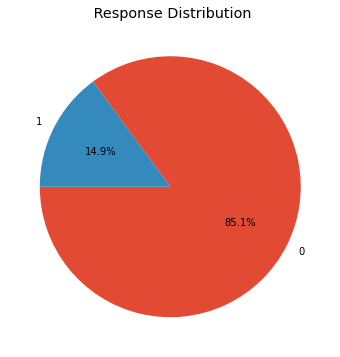

In [ ]:
plt.figure(figsize=(12,6))
plt.title(' Response Distribution')
plt.pie(df['Response'].value_counts()/9551*100, labels=df['Response'].value_counts().index, autopct='%1.1f%%', startangle=180);

только в 15% случаев клиент принял предложение в последней кампании, в большинстве случаев он отказался.

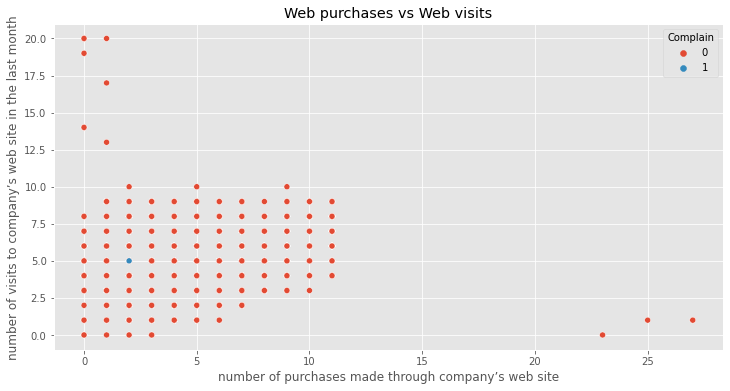

In [ ]:
plt.figure(figsize=(12,6))
sns.scatterplot(x="NumWebPurchases", y="NumWebVisitsMonth", hue='Complain', data=df)

plt.xlabel("number of purchases made through company’s web site")
plt.ylabel("number of visits to company’s web site in the last month")
plt.title('Web purchases vs Web visits');

Заметим, что за последний месяц приобретая товары онлайн через вебсайт компании iFood было сделано лишь одно замечание -> можно сказать, что сайт компании работает стабильно и без каких либо неполадок

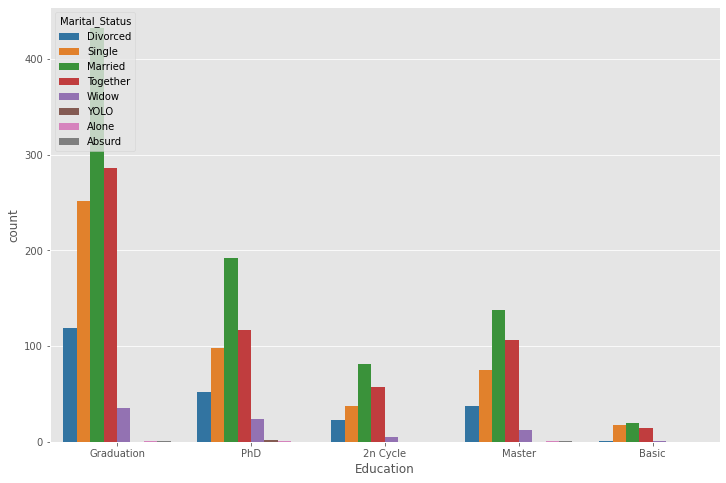

In [ ]:
sns.countplot(data=df, x="Education", hue="Marital_Status", palette="tab10")
plt.show()

Заметим, что во всех категориях образования преобладают женатые представители, а за ними следом идут парочки, которые пока что не обручились. Имея обычное образование означает крепкий союз, так как в этой категории число разведенных очень низкое.

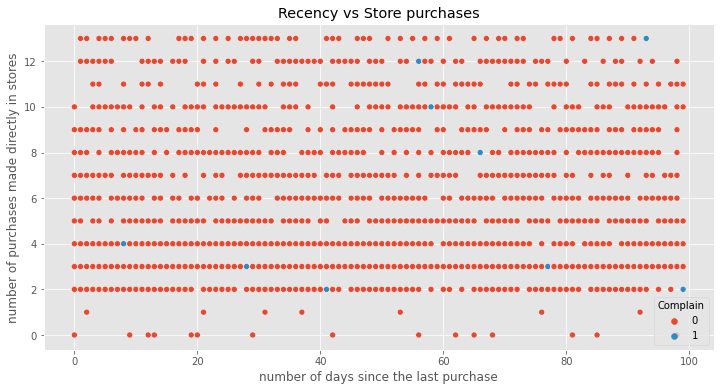

In [ ]:
plt.figure(figsize=(12,6))
sns.scatterplot(x="Recency", y="NumStorePurchases", hue='Complain', data=df)

plt.xlabel("number of days since the last purchase")
plt.ylabel("number of purchases made directly in stores")
plt.title('Recency vs Store purchases');

Вживую всё равно остаются недовольные клиенты и оставляют плохие отзывы (жалуются) после своих последних покупок.

In [ ]:
import plotly.express as px

fig = px.bar(df, y='Income', x='Country', text='Income', title="Customer’s yearly household income by country")
fig.update_traces(texttemplate='%{text:.3s}', textposition='outside')
fig.update_layout(
    autosize=False,
    width=800,
    height=500,)
fig.show()

Годовой доход клиентов из региона SP превосходит всех остальных, поскольку большинство людей (клиентов) приходится именно оттуда.

7 этап: немного исследований

Попробуем найти в данных какую-то классную интересную особенность. Может быть, рыбу едят только неженатые? Или самый большой заработок и потребление фруктов у людей без образования? Приведём все расчёты, и визуализации для обнаруженного факта. Он должен быть правда интересным и удивлять! Попробуем описать, почему так получилось.

*Интересные наблюдения:* 

- личности, недавно выпустившиеся из учебного заведенеия (Graduation) и имеющие семейное положение absurd - в среднем имеют наибольший доход по сравнению с остальными представителями, что уже необычно, это также сказывается на их затратах на рыбе, вине и фруктах, потому что считают, что могут себе всё позволить, живут в кайф 🙌🏼

- в среднем больше всех вино употребляют одинокие магистры - эстеты ☝🏽, при этом вовсе не употребляют рыбу 

- в среднем разведенные личности с обычным образованием мало зарабатывают и поэтому не могут позволить себе вино, хотя могли бы запивать горе, зарабатывая больше, но для этого стоит получить высшее образование 😁